<a href="https://colab.research.google.com/github/Indrateja25/TensorFlow/blob/master/Time_Series.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import files

In [0]:
files.upload()

Saving timeseries.xls to timeseries.xls


{'timeseries.xls': b'\xd0\xcf\x11\xe0\xa1\xb1\x1a\xe1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x03\x00\xfe\xff\t\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x92\x19\x00\x00\x01\x00\x00\x00\xfe\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\xe3\x00\x00\x00d\x01\x00\x00\xe5\x01\x00\x00f\x02\x00\x00\xe7\x02\x00\x00h\x03\x00\x00\xe9\x03\x00\x00j\x04\x00\x00\xeb\x04\x00\x00l\x05\x00\x00\xed\x05\x00\x00n\x06\x00\x00\xef\x06\x00\x00p\x07\x00\x00\xf1\x07\x00\x00r\x08\x00\x00\xf3\x08\x00\x00t\t\x00\x00\xf5\t\x00\x00v\n\x00\x00\xf7\n\x00\x00x\x0b\x00\x00\xf9\x0b\x00\x00z\x0c\x00\x00\xfb\x0c\x00\x00|\r\x00\x00\xfd\r\x00\x00~\x0e\x00\x00\xff\x0e\x00\x00\x80\x0f\x00\x00\xe1\x0f\x00\x00b\x10\x00\x00\xe3\x10\x00\x00d\x11\x00\x00\xe5\x11\x00\x00f\x12\x00\x00\xe7\x12\x00\x00h\x13\x00\x00\xe9\x13\x00\x00j\x14\x00\x00\xeb\x14\x00\x00l\x15\x00\x00\xed\x15\x00\x00n\x16\x00\x00\xef\x16\x00\x00p\x17\x00

In [0]:
import warnings
warnings.filterwarnings('ignore')

In [0]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import statsmodels.api as sm

In [0]:
plt.style.use('fivethirtyeight')
df = pd.read_excel('timeseries.xls')

In [0]:
print(df.columns)

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit'],
      dtype='object')


In [0]:
#df.groupby('State').count()
df['Category'].value_counts().head()

Office Supplies    6026
Furniture          2121
Technology         1847
Name: Category, dtype: int64

In [0]:
f = df.loc[df['Category']== 'Furniture']
print(f['Order Date'].head())

0    2016-11-08
1    2016-11-08
3    2015-10-11
5    2014-06-09
10   2014-06-09
Name: Order Date, dtype: datetime64[ns]


In [0]:
print(f['Order Date'].min())
print(f['Order Date'].max())

2014-01-06 00:00:00
2017-12-30 00:00:00


In [0]:
f = f.sort_values('Order Date')
print(f.head())

      Row ID        Order ID Order Date  ... Quantity Discount    Profit
7474    7475  CA-2014-167199 2014-01-06  ...        9      0.0  746.4078
7660    7661  CA-2014-105417 2014-01-07  ...        3      0.6  -53.7096
866      867  CA-2014-149020 2014-01-10  ...        1      0.0   21.2954
716      717  CA-2014-130092 2014-01-11  ...        2      0.0    3.0814
2978    2979  CA-2014-109232 2014-01-13  ...        6      0.0   87.3504

[5 rows x 21 columns]


In [0]:
#drop the row-id or set it to index
#kentucky.drop(columns = ['Row ID'])
f.set_index(['Order Date'] ,inplace = True)
#print(kentucky.head())

In [17]:
 y  = f['Sales'].resample('MS').mean()
 #y = f.groupby('Sales').sum()
print(y.head())


Order Date
2014-01-01    312.126250
2014-02-01    262.808286
2014-03-01    441.635030
2014-04-01    305.570654
2014-05-01    288.032792
Freq: MS, Name: Sales, dtype: float64


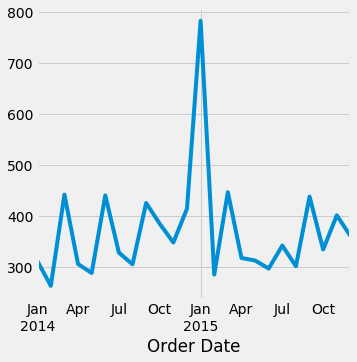

In [29]:
y.plot(figsize=(5,5))

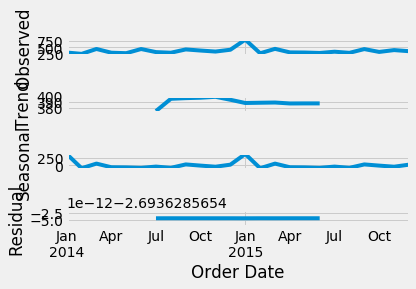

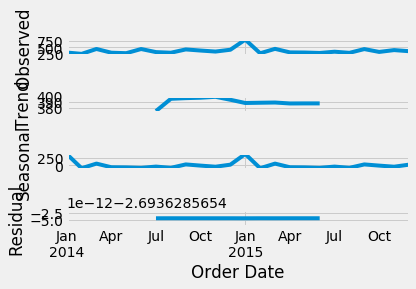

In [27]:
decomp = sm.tsa.seasonal_decompose(y,model = 'addtive')
decomp.plot()

In [0]:
y = y[:'2015']

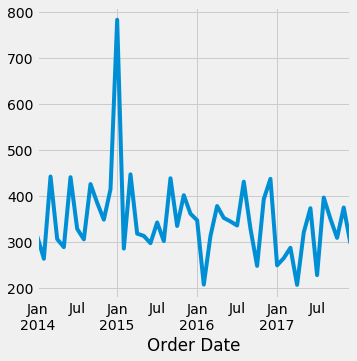

In [28]:
y1 = f['Sales'].resample('MS').mean()
y1.plot(figsize=(5,5))

In [30]:
p = q =  d = range(0,2)
print(p,q,d)
dir(p)

range(0, 2) range(0, 2) range(0, 2)


In [34]:
import itertools
pqd = list(itertools.product(p,d,q))
print(pqd)

[(0, 0, 0), (0, 0, 1), (0, 1, 0), (0, 1, 1), (1, 0, 0), (1, 0, 1), (1, 1, 0), (1, 1, 1)]


In [37]:
m = 12
seasonal_pqd = [(x[0] , x[1] , x[2] , m) for x in pqd ]
print(seasonal_pqd)

[(0, 0, 0, 12), (0, 0, 1, 12), (0, 1, 0, 12), (0, 1, 1, 12), (1, 0, 0, 12), (1, 0, 1, 12), (1, 1, 0, 12), (1, 1, 1, 12)]


In [39]:
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pqd[1], seasonal_pqd[1]))
print('SARIMAX: {} x {}'.format(pqd[1], seasonal_pqd[2]))
print('SARIMAX: {} x {}'.format(pqd[2], seasonal_pqd[3]))
print('SARIMAX: {} x {}'.format(pqd[2], seasonal_pqd[4]))


Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [56]:
#sm.tsa.api.statespace.SARIMAX
all_results =[]
best_aic = 0.0
best_result =[]
min_aic = 99999999
min_result = []
best_pdq = 0
best_spdq = 0
for i in pqd:
  for j in seasonal_pqd:
    try:
      mod = sm.tsa.statespace.SARIMAX(y,order=i,seasonal_order=j,enfore_stationarity=False,enforce_invertibility=False)
      results = mod.fit()
      all_results.append(results)
      print('SARIMAX: {} x {}, AIC = {}'.format(i,j,results.aic))
      if(results.aic> best_aic):
        best_aic=results.aic
        best_result.append(results)
        
        #print(best_pdq)
        #print(best_spdq)
      if(results.aic<min_aic):
        min_aic = results.aic
        min_result = all_results
        best_pdq = i
        best_spdq = j
    except Exception as e:
      print(str(e))
      continue

SARIMAX: (0, 0, 0) x (0, 0, 0, 12), AIC = 355.71187791268665
maxlag should be < nobs
SARIMAX: (0, 0, 0) x (0, 1, 0, 12), AIC = 155.47466138547145
maxlag should be < nobs
SARIMAX: (0, 0, 0) x (1, 0, 0, 12), AIC = 333.8953108267632
maxlag should be < nobs
maxlag should be < nobs
maxlag should be < nobs
SARIMAX: (0, 0, 1) x (0, 0, 0, 12), AIC = 341.9777742385287
maxlag should be < nobs
SARIMAX: (0, 0, 1) x (0, 1, 0, 12), AIC = 157.46764024923328
maxlag should be < nobs
SARIMAX: (0, 0, 1) x (1, 0, 0, 12), AIC = 328.76408949077165
maxlag should be < nobs
maxlag should be < nobs
maxlag should be < nobs
SARIMAX: (0, 1, 0) x (0, 0, 0, 12), AIC = 300.2707915183352
maxlag should be < nobs
SARIMAX: (0, 1, 0) x (0, 1, 0, 12), AIC = 144.8570450061845
maxlag should be < nobs
SARIMAX: (0, 1, 0) x (1, 0, 0, 12), AIC = 300.55180966574545
maxlag should be < nobs
maxlag should be < nobs
maxlag should be < nobs
SARIMAX: (0, 1, 1) x (0, 0, 0, 12), AIC = 286.66708542674684
maxlag should be < nobs
SARIMAX: (

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


SARIMAX: (1, 0, 1) x (0, 0, 0, 12), AIC = 303.3076864327848
maxlag should be < nobs
SARIMAX: (1, 0, 1) x (0, 1, 0, 12), AIC = 159.404572180542
maxlag should be < nobs


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


SARIMAX: (1, 0, 1) x (1, 0, 0, 12), AIC = 305.27864486453024
maxlag should be < nobs
maxlag should be < nobs
maxlag should be < nobs
SARIMAX: (1, 1, 0) x (0, 0, 0, 12), AIC = 292.20098383706204
maxlag should be < nobs
SARIMAX: (1, 1, 0) x (0, 1, 0, 12), AIC = 146.0127871222108
maxlag should be < nobs
SARIMAX: (1, 1, 0) x (1, 0, 0, 12), AIC = 294.0645485123829
maxlag should be < nobs
maxlag should be < nobs
maxlag should be < nobs
SARIMAX: (1, 1, 1) x (0, 0, 0, 12), AIC = 288.44388687610797
maxlag should be < nobs
SARIMAX: (1, 1, 1) x (0, 1, 0, 12), AIC = 146.45535623871766
maxlag should be < nobs
SARIMAX: (1, 1, 1) x (1, 0, 0, 12), AIC = 290.4419269844203
maxlag should be < nobs
maxlag should be < nobs
maxlag should be < nobs


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


In [57]:
print(dir(best_result))
print(best_pdq)
print(best_spdq)

['__add__', '__class__', '__contains__', '__delattr__', '__delitem__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__gt__', '__hash__', '__iadd__', '__imul__', '__init__', '__init_subclass__', '__iter__', '__le__', '__len__', '__lt__', '__mul__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__reversed__', '__rmul__', '__setattr__', '__setitem__', '__sizeof__', '__str__', '__subclasshook__', 'append', 'clear', 'copy', 'count', 'extend', 'index', 'insert', 'pop', 'remove', 'reverse', 'sort']
(0, 1, 0)
(0, 1, 0, 12)


In [0]:
model = sm.tsa.statespace.SARIMAX(y1,order=(0,1,0), seasonal_order=(0,1,0,12) , enforce_stationarity = False , enforce_invertibility = False)
results = model.fit()
predictions = results.get_prediction(start=pd.to_datetime('2017-01-01') , dynamic = False)
prediction_ci = predictions.conf_int()

In [59]:
print(prediction_ci)

            lower Sales  upper Sales
Order Date                          
2017-01-01   152.733430   692.114095
2017-02-01  -161.069370   378.311295
2017-03-01   100.013376   639.394041
2017-04-01    82.245797   621.626462
2017-05-01   -89.510046   449.870619
2017-06-01    42.601947   581.982612
2017-07-01    94.154863   633.535529
2017-08-01    52.849223   592.229888
2017-09-01    24.267313   563.647978
2017-10-01    -1.076001   538.304664
2017-11-01   183.581105   722.961770
2017-12-01   148.880810   688.261475


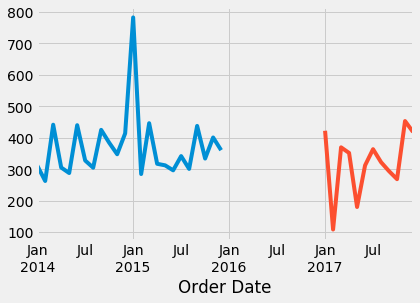

In [60]:
ax = y["2014":].plot(label = 'observed')
predictions.predicted_mean.plot(ax = ax,label = 'one-step-ahead-forecast')